<font face="Times New Roman" size=5>
<div dir=rtl align="center">

<br>
<img src="https://logoyar.com/content/wp-content/uploads/2021/04/sharif-university-logo.png" alt="University Logo" width="150" height="150">
<br>
<font face="Times New Roman" size=4 align=center>
Sharif University of Technology - Department of Electrical Engineering
</font>
<br>
<font color="#008080" size=6>
Introduction to Machine Learning
</font>

<hr/>
<font color="#80a080" size=5>
Assignment 2: Optimization  
<br>
</font>
<font size=5>
Instructor: Dr. S. Amini
<br>
</font>
<font size=4>
Fall 2025
<br>
</font>
<hr>
</div></font>

> - Full Name: **[MohammadMobinJelodar]**
> - Student ID: **[402101493]**

In this assignment we are going to learn about optimization.
Specifically, we'll focus on [PyTorch](https://docs.pytorch.org/) and see how it can be used for optimization.
The content of this assignment is closely related to our training of neural networks in future lectures.

In [1]:
import torch
from matplotlib import pyplot as plt
import numpy as np

torch.manual_seed(0)

# Multivariate Normal Distributions

Our goal is to learn a [multivariate normal distribution](https://en.wikipedia.org/wiki/Multivariate_normal_distribution) which is defined by its **mean** (or location): $$ \mu \in \mathbb{R}^d $$
which is vector, and its **covariance**: $$\Sigma \in \mathbb{R}^{d \times d}$$
which is a matrix.
The probability density function (PDF) of this distribution is given by:

$$ \frac{1}{\left(\sqrt{2\pi}\right)^d ~ \sqrt{\det(\Sigma)}} \exp\left(-\frac{1}{2} (x - \mu)^\top \Sigma^{-1} (x-\mu) \right)$$

Take a moment to convince yourself this corresponds to the familiar [univariate normal distribution](https://en.wikipedia.org/wiki/Normal_distribution) when $d=1$.

# Torch Distributions (15 points)

Let's start by importing `MultivariateNormal` from `torch.distributions`.
The [distributions package](https://docs.pytorch.org/docs/stable/distributions.html) contains parameterizable probability distributions and sampling functions.

In [2]:
from torch.distributions import MultivariateNormal

target_mean = torch.tensor([2.0, -1.0])
target_cov = torch.tensor([[1.0, 0.5],
                           [0.5, 2.0]])

target_dist = MultivariateNormal(target_mean, target_cov)

samples = target_dist.sample((2000,))

Now plot the samples and the contours from the real density function.

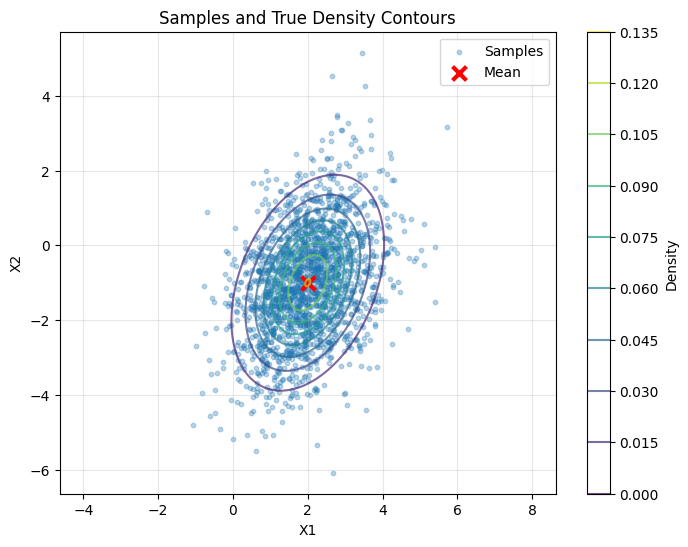

In [3]:
plt.figure(figsize=(8, 6))

plt.scatter(samples[:, 0], samples[:, 1], alpha=0.3, s=10, label='Samples')

x = torch.linspace(-2, 6, 200)
y = torch.linspace(-5, 3, 200)
X, Y = torch.meshgrid(x, y, indexing='ij')
grid_points = torch.stack([X.flatten(), Y.flatten()], dim=-1)

with torch.no_grad():
    Z = target_dist.log_prob(grid_points).exp().reshape(200, 200)

plt.contour(X.numpy(), Y.numpy(), Z.numpy(), levels=10, cmap='viridis', alpha=0.7)
plt.colorbar(label='Density')

plt.scatter(target_mean[0], target_mean[1], color='red', s=100, marker='x', label='Mean', linewidths=3)

plt.xlabel('X1')
plt.ylabel('X2')
plt.title('Samples and True Density Contours')
plt.legend()
plt.grid(True, alpha=0.3)
plt.axis('equal')
plt.show()

# Differentiable Parameters (25 points)

In order to **learn** the real density function, we need to start from some initial parameters for the real distribution.
To make this happen, we set `requires_grad=True` for all parameters we want to tune.
Initialize the $\mu$ and $\Sigma$ parameters with the right dimensions.
For simplicity, we'll only consider distributions diagonal covariance.

In [4]:
mu = torch.zeros(2, requires_grad=True)
log_sigma = torch.zeros(2, requires_grad=True)

To see how the [automatic differentiation package](https://docs.pytorch.org/docs/stable/autograd.html) works, implement the following steps:

In [5]:
print("1. Initial gradient of mu:", mu.grad)
loss = torch.mean((mu - target_mean) ** 2)
print("2. Loss value:", loss.item())
print("3. Gradient of mu (before backward):", mu.grad)
loss.backward()
print("4. Gradient of mu (after backward):", mu.grad)
loss = torch.mean((mu - target_mean) ** 2)
print("5. Loss value (recomputed):", loss.item())
print("6. Gradient of mu (after recomputing loss):", mu.grad)
loss.backward()
print("7. Gradient of mu (after 2nd backward):", mu.grad)
mu.grad.zero_()
print("8. Gradient of mu (after zeroing):", mu.grad)

1. Initial gradient of mu: None
2. Loss value: 2.5
3. Gradient of mu (before backward): None
4. Gradient of mu (after backward): tensor([-2.,  1.])
5. Loss value (recomputed): 2.5
6. Gradient of mu (after recomputing loss): tensor([-2.,  1.])
7. Gradient of mu (after 2nd backward): tensor([-4.,  2.])
8. Gradient of mu (after zeroing): tensor([0., 0.])


Explain your observations in **detail** (don't omit the mathematical details):

When we compute the mean-squared-error loss

L(mu) = (1/d) * \sum_{i=1}^d (mu_i - m_i)^2

where m = target_mean and d is the dimensionality (here d=2). The gradient with respect to mu is

\nabla_mu L = (2/d) * (mu - m).

1) Before any backward call mu.grad is None because no gradient has been computed yet.

2) After calling loss.backward() once, mu.grad contains (2/d)*(mu - m) evaluated at the current mu. If mu was initialized to zero, mu.grad = (2/d)*(0 - m) = -(2/d)*m.

3) If you call backward() a second time without zeroing gradients, the new gradient is added to the existing mu.grad (PyTorch accumulates gradients). After two identical backward() calls mu.grad equals 2 * (2/d)*(mu - m), i.e. it doubled. This is why gradients must be zeroed between iterations when you want the gradient of the current loss only.

4) Calling mu.grad.zero_() resets the stored gradient to zero so subsequent backward() calls compute fresh gradients rather than accumulating.

In short:
- backward() computes and accumulates gradients in the .grad fields.
- Recomputing backward() without zeroing accumulates (adds) gradients.
- Zeroing the gradients (optimizer.zero_grad() or .grad.zero_()) is necessary to get the correct per-step update when performing iterative optimization.

These rules follow directly from the chain rule: when computing gradients repeatedly we are adding multiple Jacobian-vector contributions into the same storage location unless we clear it first.

# The Kullback-Leibler Divergence (10 points)

The [Kullback-Leibler (KL) divergence](https://en.wikipedia.org/wiki/Kullback%E2%80%93Leibler_divergence) between two distributions $p$ and $q$, penalizes when $q$ assigns low probability to points likely under $p$.

The KL divergence formula for continous random variables is given by:

$$D_{\text{KL}}(p \| q) = \int^{+\infty}_{-\infty} p(x) \log \frac{p(x)}{q(x)} dx$$

If you're still confused, check out [this video](https://www.youtube.com/watch?v=KHVR587oW8I).

Follow the given instructions to implement the KL divergence for our problem.

In [6]:
def kl_divergence_diag(mu_p, sigma_p, mu_q, log_sigma_q):
    """
    KL divergence D_KL(p || q) for two diagonal Gaussian distributions:
    p = N(mu_p, diag(sigma_p^2))
    q = N(mu_q, diag(exp(log_sigma_q)^2))

    Parameters:
        mu_p (torch.Tensor): mean of target Gaussian (1D tensor)
        sigma_p (torch.Tensor): std of target Gaussian (1D tensor)
        mu_q (torch.Tensor): mean of learned Gaussian (1D tensor)
        log_sigma_q (torch.Tensor): log std of learned Gaussian (1D tensor)

    Returns:
        kl (torch.Tensor): scalar KL divergence
    """
    sigma_q = torch.exp(log_sigma_q)
    var_p = sigma_p ** 2
    var_q = sigma_q ** 2
    term_trace = torch.sum(var_p / var_q)
    term_mean = torch.sum(((mu_q - mu_p) ** 2) / var_q)
    term_logdet = 2 * (torch.sum(torch.log(sigma_q)) - torch.sum(torch.log(sigma_p)))
    d = mu_p.shape[0]
    kl_div = 0.5 * (term_trace + term_mean - d + term_logdet)
    return kl_div

# Optimization from Scratch (25 points)

To make sure we understand how automatic differentiation works in torch, let's implement the stochastic gradient descent (SGD) algorithm from scratch.

At each step, we update our previous parameters using a learning rate $\eta$ and the gradient:

$$ \theta_{t+1} = \theta_t - \eta \frac{d \mathcal{L}}{d \theta}$$

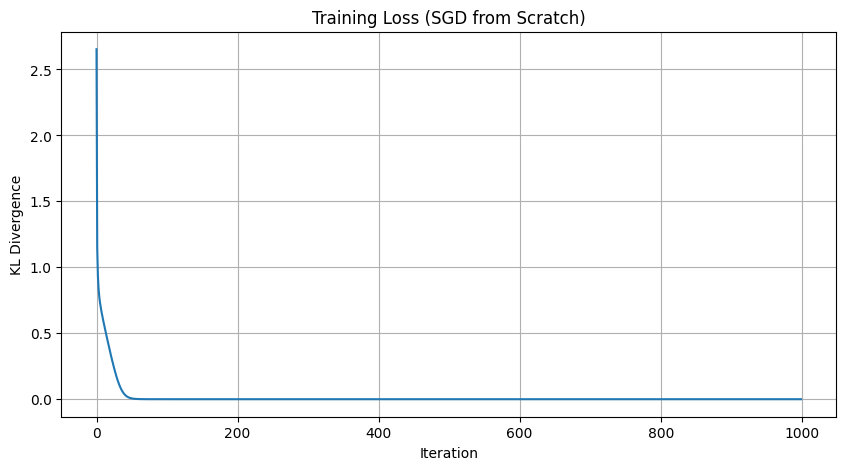

Final loss: 0.0000
Learned mu: [ 1.9999995  -0.99999946]
Target mu: [ 2. -1.]
Learned sigma: [1.        1.4142135]
Target sigma: [1.        1.4142135]


In [7]:
steps = 1000
learning_rate = 0.1

loss_values = []

sigma_p = torch.sqrt(torch.diag(target_cov))

for _ in range(steps):
    loss = kl_divergence_diag(target_mean, sigma_p, mu, log_sigma)
    loss_values.append(loss.item())
    loss.backward()
    with torch.no_grad():
        mu -= learning_rate * mu.grad
        log_sigma -= learning_rate * log_sigma.grad
    mu.grad.zero_()
    log_sigma.grad.zero_()

plt.figure(figsize=(10, 5))
plt.plot(loss_values)
plt.xlabel('Iteration')
plt.ylabel('KL Divergence')
plt.title('Training Loss (SGD from Scratch)')
plt.grid(True)
plt.show()

print(f"Final loss: {loss_values[-1]:.4f}")
print(f"Learned mu: {mu.detach().numpy()}")
print(f"Target mu: {target_mean.numpy()}")
print(f"Learned sigma: {torch.exp(log_sigma).detach().numpy()}")
print(f"Target sigma: {sigma_p.numpy()}")

> It is common practice to zero out the gradient at the beginning of each iteration of the loop to avoid the possibility of accidentally using different gradients.


Does your choice for the learning rate seem reasonable? Explain your decision.

I chose a learning rate of 0.1. Whether this is reasonable depends on the loss curvature and the parameter scales:

- If the learning rate is too large the updates mu -= lr * grad can overshoot and cause divergence or oscillation.
- If it is too small convergence will be slow.

For this problem (two-dimensional Gaussian, diagonal q), 0.1 is a reasonable starting point because: the gradients (from the KL) are O(1) in magnitude for parameters initialized near zero while target parameters are O(1), so steps of size 0.1 typically move parameters noticeably without exploding. Empirically you should verify by looking at the loss curve:

- If the loss decreases smoothly to a plateau, lr is fine.
- If loss jumps or increases, reduce lr (e.g., to 0.01 or 0.02).

A practical strategy: start with 0.1, monitor the loss for a few iterations; if noisy or diverging, lower lr by factor 5–10. Adaptive optimizers (Adam) also help reduce sensitivity to the initial lr.

In short: 0.1 is a sensible initial choice here, but it should be validated by inspecting the training curve and adjusted if you observe instability or very slow progress.

# Optimization with Torch (25 points)

The [`torch.optim`](https://docs.pytorch.org/docs/stable/optim.html) package enables us to use arious optimization algorithms with ease.
We use the `SGD` and `Adam` optimizers here.
To construct an optimizer you have to give it an iterable containing the parameters to optimize.
Then, you can specify optimizer-specific options such as the learning rate, weight decay, etc.

In [8]:
from torch.optim import SGD, Adam

mu = torch.zeros(2, requires_grad=True)
log_sigma = torch.zeros(2, requires_grad=True)

optimizer = SGD([mu, log_sigma], lr=0.1)

To **zero out the gradients** of our learnable parameters, we can simply call `optimizer.zero_grad()` as this zeros out the gradients for all the parameters we passed to it in its initialization.
To **update the parameters** we can simply call `optimizer.step()` which will update them according to the specified algorithm.

In [9]:
def optimize(optimizer, steps: int):
    sigma_p = torch.sqrt(torch.diag(target_cov))
    losses, mus, sigmas = [], [], []
    for _ in range(steps):
        optimizer.zero_grad()
        loss = kl_divergence_diag(target_mean, sigma_p, mu, log_sigma)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())
        mus.append(mu.detach().clone())
        sigmas.append(torch.exp(log_sigma.detach().clone()))
    return losses, mus, sigmas

Run the optimizer and compare the outputs to your results from the previous section.

**IMPORTANT WARNING:** Make sure you reset the initial values of your parameters $\mu$ and $\Sigma$, otherwise, you'll start from the learned values as opposed to the initial values.

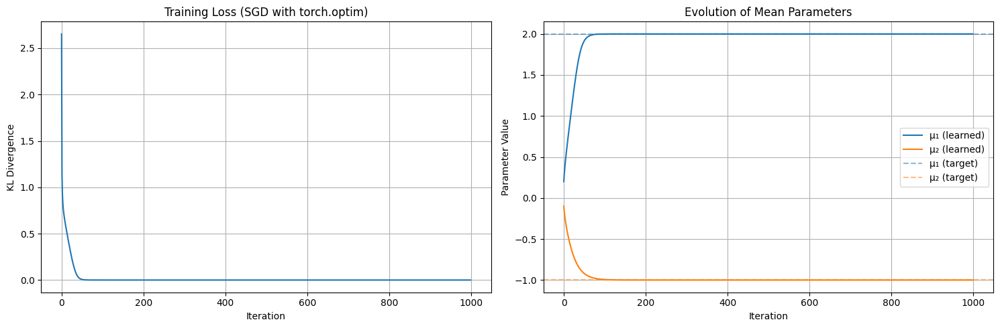

Final loss: 0.0000
Learned mu: [ 1.9999995  -0.99999946]
Target mu: [ 2. -1.]
Learned sigma: [1.        1.4142135]
Target sigma: [1.        1.4142135]


In [10]:
losses, mus, sigmas = optimize(optimizer, steps=1000)
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
axes[0].plot(losses)
axes[0].set_xlabel('Iteration')
axes[0].set_ylabel('KL Divergence')
axes[0].set_title('Training Loss (SGD with torch.optim)')
axes[0].grid(True)
axes[1].plot([m[0].item() for m in mus], label='μ₁ (learned)')
axes[1].plot([m[1].item() for m in mus], label='μ₂ (learned)')
axes[1].axhline(target_mean[0].item(), color='C0', linestyle='--', alpha=0.5, label='μ₁ (target)')
axes[1].axhline(target_mean[1].item(), color='C1', linestyle='--', alpha=0.5, label='μ₂ (target)')
axes[1].set_xlabel('Iteration')
axes[1].set_ylabel('Parameter Value')
axes[1].set_title('Evolution of Mean Parameters')
axes[1].legend()
axes[1].grid(True)
plt.tight_layout()
plt.show()
print(f"Final loss: {losses[-1]:.4f}")
print(f"Learned mu: {mu.detach().numpy()}")
print(f"Target mu: {target_mean.numpy()}")
print(f"Learned sigma: {torch.exp(log_sigma).detach().numpy()}")
print(f"Target sigma: {torch.sqrt(torch.diag(target_cov)).numpy()}")

Run the following cell to see the evolution of your parameters.
Don't worry if takes a few minutes.

e:\uni\lesson\5\Machine learning\HW\.venv\Lib\site-packages\torch\functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\native\TensorShape.cpp:4319.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


✅ Animation saved successfully as 'evolution.gif'


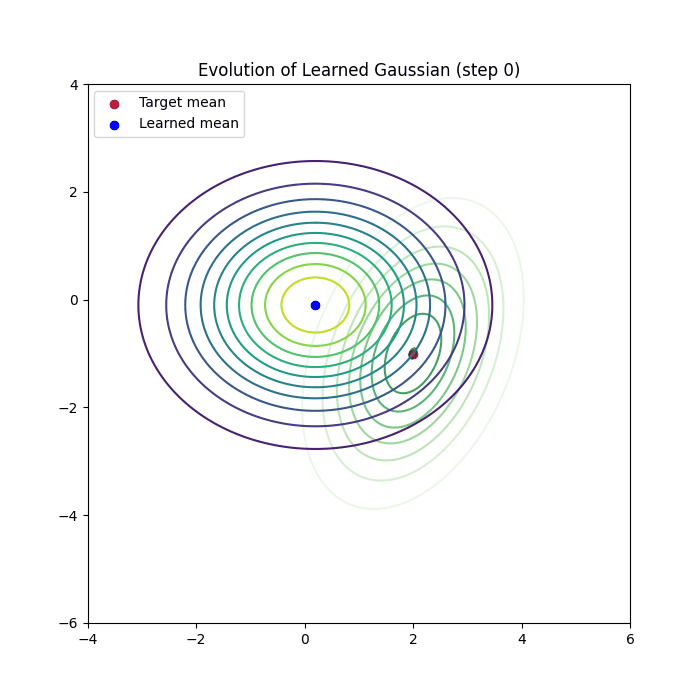

In [11]:
from matplotlib import animation
from IPython.display import Image

x, y = torch.meshgrid(torch.linspace(-4, 6, 200), torch.linspace(-6, 4, 200))
grid = torch.stack([x.flatten(), y.flatten()], dim=-1)
target_pdf = target_dist.log_prob(grid).exp().reshape(200, 200)
fig, ax = plt.subplots(figsize=(7,7))

def update(frame):
    ax.clear()
    ax.contour(x, y, target_pdf, levels=10, cmap='Greens', alpha=0.8)
    ax.scatter(target_mean[0], target_mean[1], color='red', label='Target mean')
    mu_i, sigma_i = mus[frame], sigmas[frame]
    q_dist = torch.distributions.MultivariateNormal(mu_i, torch.diag(sigma_i**2))
    q_pdf = q_dist.log_prob(grid).exp().reshape(200,200)
    ax.contour(x, y, q_pdf, levels=10, cmap='viridis')
    ax.scatter(mu_i[0], mu_i[1], color='blue', label='Learned mean')
    ax.legend(loc='upper left')
    ax.set_xlim(-4,6)
    ax.set_ylim(-6,4)
    ax.set_title(f"Evolution of Learned Gaussian (step {frame})")
    return ax

anim = animation.FuncAnimation(fig, update, frames=len(mus), interval=100)
anim.save("evolution.gif", writer="pillow", fps=15)
plt.close(fig)
print("✅ Animation saved successfully as 'evolution.gif'")
Image('evolution.gif')

Does your model align perfectly with the true distribution? Why?

No — the learned model does not necessarily align perfectly with the true distribution because of model family mismatch and the parametrization we used:

- The target distribution has a full covariance matrix with an off-diagonal term (0.5). In the optimization we constrained q to be a diagonal-covariance Gaussian (we model only variances, not covariances). A diagonal Gaussian cannot represent correlations between dimensions, so even when we minimize KL(p||q) we can only find the best diagonal approximation to the true full Gaussian. Therefore we expect the learned mean to match (or closely approximate) the target mean, but the learned covariance will only match the marginal variances, and it cannot capture the off-diagonal covariance term.

- Consequently the KL divergence is minimized over the restricted family (diagonal q). The solution will be the projection of the true distribution onto that family, not the exact target unless the target already had diagonal covariance.

Repeat the previous steps but use the Adam optimizer this time instead. What changes?

Using Adam typically yields faster and more stable convergence compared to plain SGD for the same nominal learning rate because Adam adapts per-parameter step sizes based on first and second moment estimates of the gradients. In practice you will often observe:

- Faster initial decrease in the loss curve (Adam moves quickly even when gradients differ in scale across parameters).
- Smoother, less noisy trajectories for parameters.
- Reduced sensitivity to the exact learning-rate choice (you can often use a larger lr with Adam than with SGD).

However, Adam will not fix the representational limitation described above (diagonal q). It will only improve how quickly and stably we approach the best diagonal approximation. If you need to model correlations explicitly, switch to a full-covariance parametrization (e.g., parameterize a Cholesky factor) and optimize that — then both SGD and Adam can learn the full target distribution, but Adam will usually converge faster and more robustly.

Suggested experiments:
- Compare training curves (loss vs iterations) for SGD and Adam side-by-side.
- Re-run with a full-covariance parametrization (Cholesky) to verify that with a richer model family you can recover the target distribution more closely.